<a href="https://colab.research.google.com/github/Kalyan9150/Breast-Cancer-Detection/blob/main/Class_Breast_Cancer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pillow
!pip install imageio
!pip install scikit-learn
!pip install keras-tuner
!pip install keras-tuner
!pip install matplotlib
!pip install tensorflow

Import the dataset

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d tommyngx/breastcancermasses

Dataset URL: https://www.kaggle.com/datasets/tommyngx/breastcancermasses
License(s): CC-BY-NC-SA-4.0
 98% 794M/809M [00:08<00:00, 126MB/s]
100% 809M/809M [00:08<00:00, 102MB/s]


In [ ]:
#unzipping the file
import zipfile
zip_ref = zipfile.ZipFile('/content/breastcancermasses.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

CREATING A NEW DIRECTORY

In [ ]:
import os

directory_name = 'Our_Dataset'  # Store the directory name in a variable
os.makedirs(directory_name, exist_ok=True)  # Use makedirs to create the directory


In [ ]:
import shutil

# Define the source and destination paths
source_dir = "/content/Dataset of Mammography with Benign Malignant Breast Masses/Dataset of Mammography with Benign Malignant Breast Masses/INbreast+MIAS+DDSM Dataset"
destination_dir = "/content/Our_Dataset" # Changed destination to avoid conflict

# Copy the directory
shutil.copytree(source_dir, destination_dir, dirs_exist_ok=True) # Use dirs_exist_ok=True to allow overwriting
print("Directory copied successfully.")

Directory copied successfully.


Counting the number of files in the dataset_OUR_DATASET

In [ ]:
def count_files_in_directory(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Directory path
directory_path = '/content/Our_Dataset/Benign Masses'
file_count_benign = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_benign}")

# Directory path
directory_path = '/content/Our_Dataset/Malignant Masses'
file_count_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_malignant}")


total = file_count_benign + file_count_malignant
print(f"Total Number of files : {total}")

Number of files in '/content/Our_Dataset/Benign Masses': 10866
Number of files in '/content/Our_Dataset/Malignant Masses': 13710
Total Number of files : 24576


Importing Libraries

In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from google.colab.patches import cv2_imshow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential

**PREPROCESSING METHODS-**

**1. Image Resizing**

**2. Mean Filtering**

**3. Median Filtering**

**4. Gaussian Filtering**



**6. Un- Sharp Masking**

**7. Histogram Equalisation**

**8. Anisotropic Diffusion**

**9. CLAHE Algorithm**

Image Resizing

We make a new directory named Resized _Images under which we create two folders named Benign and Malignant Masses respectively.

In [ ]:
import os

directory_name = 'Resized_Images/Benign Masses'  # Store the directory name in a variable
directory_name = 'Resized_Images/Malignant Masses'
os.makedirs(directory_name, exist_ok=True)  # Use makedirs to create the directory
# Define directories
input_dir = '/content/Our_Dataset/Benign Masses'
output_dir = 'Resized_Images/Benign Masses'

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)


In [ ]:
# Function to resize an image
from PIL import Image # import the Image module from PIL

def resize_image(image_path, output_path, size):
    with Image.open(image_path) as img:
        img = img.resize(size, Image.LANCZOS)
        img.save(output_path)

# Directory containing images
input_directory = '/content/Our_Dataset/Benign Masses'
# Directory to save resized images
output_directory = '/content/Resized_Images/Benign Masses'
# Resize dimensions (width, height)
resize_dimensions = (250, 250)

In [ ]:
# Iterate over all files in the input directory
for filename in os.listdir(input_directory):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
        input_path = os.path.join(input_directory, filename)
        output_path = os.path.join(output_directory, filename)
        resize_image(input_path, output_path, resize_dimensions)

print("Resizing completed.")

Resizing completed.


In [ ]:
# Function to resize an image
from PIL import Image # import the Image module from PIL

def resize_image(image_path, output_path, size):
    with Image.open(image_path) as img:
        img = img.resize(size, Image.LANCZOS)
        img.save(output_path)

# Directory containing images
input_directory = '/content/Our_Dataset/Malignant Masses'
# Directory to save resized images
output_directory = '/content/Resized_Images/Malignant Masses'
# Resize dimensions (width, height)
resize_dimensions = (800, 600)

In [ ]:
# Iterate over all files in the input directory
for filename in os.listdir(input_directory):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
        input_path = os.path.join(input_directory, filename)
        output_path = os.path.join(output_directory, filename)
        resize_image(input_path, output_path, resize_dimensions)

print("Malignant Resizing completed.")

Malignant Resizing completed.


Counting Number of Files after resizing




In [ ]:
def count_files_in_directory(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Directory path
directory_path = '/content/Resized_Images/Benign Masses'
file_count_benign = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_benign}")

# Directory path
directory_path = '/content/Resized_Images/Malignant Masses'
file_count_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_malignant}")


total = file_count_benign + file_count_malignant
print(f"Total Number of files : {total}")


def list_files(directory):
    return sorted([f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))])

def compare_images(img1_path, img2_path):
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    if img1.shape != img2.shape:
        return False

    difference = cv2.subtract(img1, img2)
    b, g, r = cv2.split(difference)

    return cv2.countNonZero(b) == 0 and cv2.countNonZero(g) == 0 and cv2.countNonZero(r) == 0

def compare_folders(folder1, folder2):
    files1 = list_files(folder1)
    files2 = list_files(folder2)

    if files1 != files2:
        return False

    for file in files1:
        file1_path = os.path.join(folder1, file)
        file2_path = os.path.join(folder2, file)

        if not compare_images(file1_path, file2_path):
            return False

    return True

# Replace these with your folder paths
folder1_path = '/content/Resized_Images/Benign Masses'
folder2_path = '/content/Resized_Images/Malignant Masses'

if compare_folders(folder1_path, folder2_path):
    print("The folders have the same files.")
else:
    print("The folders do not have the same files.")


Number of files in '/content/Resized_Images/Benign Masses': 10866
Number of files in '/content/Resized_Images/Malignant Masses': 13710
Total Number of files : 24576
The folders do not have the same files.


**Mean Filtering**

In [ ]:
# Function to apply mean filtering
def mean_filter(image_path, output_path):
    img = cv2.imread(image_path)
    mean_filtered = cv2.blur(img, (5, 5))  # Mean filter with a 5x5 kernel
    cv2.imwrite(output_path, mean_filtered)

# Function to process all images in a directory and its subdirectories
def process_directory(input_directory, output_directory):
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    for root, _, files in os.walk(input_directory):
        # Create corresponding output directory
        relative_path = os.path.relpath(root, input_directory)
        output_subdir = os.path.join(output_directory, relative_path)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)

        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                input_path = os.path.join(root, file)
                output_path = os.path.join(output_subdir, file)
                mean_filter(input_path, output_path)

# Directories
input_directory = '/content/Resized_Images/Benign Masses'
output_directory = 'Mean_Filtered/Benign Masses'

# Process the directory
process_directory(input_directory, output_directory)

print("Mean filtering on benign images completed.")


Mean filtering on benign images completed.


In [ ]:
# Function to apply mean filtering
def mean_filter(image_path, output_path):
    img = cv2.imread(image_path)
    mean_filtered = cv2.blur(img, (5, 5))  # Mean filter with a 5x5 kernel
    cv2.imwrite(output_path, mean_filtered)

# Function to process all images in a directory and its subdirectories
def process_directory(input_directory, output_directory):
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    for root, _, files in os.walk(input_directory):
        # Create corresponding output directory
        relative_path = os.path.relpath(root, input_directory)
        output_subdir = os.path.join(output_directory, relative_path)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)

        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                input_path = os.path.join(root, file)
                output_path = os.path.join(output_subdir, file)
                mean_filter(input_path, output_path)

# Directories
input_directory = '/content/Resized_Images/Malignant Masses'
output_directory = 'Mean_Filtered/Malignant Masses'


# Process the directory
process_directory(input_directory, output_directory)

print("Mean filtering on Malignant images completed.")

Mean filtering on Malignant images completed.


Counting Number of Files after resizing

In [ ]:
def count_files_in_directory(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Directory path
directory_path = "/content/Mean_Filtered/Benign Masses"
file_count_benign = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_benign}")

# Directory path
directory_path = '/content/Mean_Filtered/Malignant Masses'
file_count_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_malignant}")


total = file_count_benign + file_count_malignant
print(f"Total Number of files : {total}")


def list_files(directory):
    return sorted([f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))])

def compare_images(img1_path, img2_path):
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    if img1.shape != img2.shape:
        return False

    difference = cv2.subtract(img1, img2)
    b, g, r = cv2.split(difference)

    return cv2.countNonZero(b) == 0 and cv2.countNonZero(g) == 0 and cv2.countNonZero(r) == 0

def compare_folders(folder1, folder2):
    files1 = list_files(folder1)
    files2 = list_files(folder2)

    if files1 != files2:
        return False

    for file in files1:
        file1_path = os.path.join(folder1, file)
        file2_path = os.path.join(folder2, file)

        if not compare_images(file1_path, file2_path):
            return False

    return True

# Replace these with your folder paths
folder1_path = '/content/Mean_Filtered/Benign Masses'
folder2_path = '/content/Mean_Filtered/Malignant Masses'

if compare_folders(folder1_path, folder2_path):
    print("The folders have the same files.")
else:
    print("The folders do not have the same files.")


Number of files in '/content/Mean_Filtered/Benign Masses': 10866
Number of files in '/content/Mean_Filtered/Malignant Masses': 13710
Total Number of files : 24576
The folders do not have the same files.


**Median Filtering**

In [ ]:

from PIL import Image, ImageFilter # Import PIL for image filtering

# Function to apply mean filtering
def median_filtered_img(image_path, output_path):
    img = cv2.imread(image_path)
    # Convert the OpenCV image to a PIL Image
    img_pil = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    median_filtered_img_pil = img_pil.filter(ImageFilter.MedianFilter(size=3))
    # Convert the PIL image back to an OpenCV image
    median_filtered_img = cv2.cvtColor(np.array(median_filtered_img_pil), cv2.COLOR_RGB2BGR)
    cv2.imwrite(output_path, median_filtered_img)

# Function to process all images in a directory and its subdirectories
def process_directory(input_directory, output_directory):
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    for root, _, files in os.walk(input_directory):
        # Create corresponding output directory
        relative_path = os.path.relpath(root, input_directory)
        output_subdir = os.path.join(output_directory, relative_path)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)

        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                input_path = os.path.join(root, file)
                output_path = os.path.join(output_subdir, file)
                median_filtered_img(input_path, output_path)

# Directories
input_directory = '/content/Mean_Filtered/Benign Masses'
output_directory = 'Median_Filtered/Benign Masses'


# Process the directory
process_directory(input_directory, output_directory)

print("Median filtering on Benign Masses is completed.")


Median filtering on Benign Masses is completed.


In [ ]:
# Function to apply mean filtering
def median_filtered_img(image_path, output_path):
    img = cv2.imread(image_path)
    # Convert the OpenCV image to a PIL Image
    img_pil = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    median_filtered_img_pil = img_pil.filter(ImageFilter.MedianFilter(size=3))
    # Convert the PIL image back to an OpenCV image
    median_filtered_img = cv2.cvtColor(np.array(median_filtered_img_pil), cv2.COLOR_RGB2BGR)
    cv2.imwrite(output_path, median_filtered_img)

# Function to process all images in a directory and its subdirectories
def process_directory(input_directory, output_directory):
    # Create the output directory if it doesn't exist
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    for root, _, files in os.walk(input_directory):
        # Create corresponding output directory
        relative_path = os.path.relpath(root, input_directory)
        output_subdir = os.path.join(output_directory, relative_path)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)

        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                input_path = os.path.join(root, file)
                output_path = os.path.join(output_subdir, file)
                median_filtered_img(input_path, output_path)

# Directories
input_directory = '/content/Mean_Filtered/Malignant Masses'
output_directory = 'Median_Filtered/Malignant Masses'



# Process the directory
process_directory(input_directory, output_directory)

print("Median filtering on Malignant Masses is completed.")

Median filtering on Malignant Masses is completed.


Number of files

In [ ]:
def count_files_in_directory(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Directory path
directory_path = '/content/Median_Filtered/Benign Masses'
file_count_benign = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_benign}")

# Directory path
directory_path = '/content/Median_Filtered/Malignant Masses'
file_count_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_malignant}")


total = file_count_benign + file_count_malignant
print(f"Total Number of files : {total}")



def list_files(directory):
    return sorted([f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))])

def compare_images(img1_path, img2_path):
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    if img1.shape != img2.shape:
        return False

    difference = cv2.subtract(img1, img2)
    b, g, r = cv2.split(difference)

    return cv2.countNonZero(b) == 0 and cv2.countNonZero(g) == 0 and cv2.countNonZero(r) == 0

def compare_folders(folder1, folder2):
    files1 = list_files(folder1)
    files2 = list_files(folder2)

    if files1 != files2:
        return False

    for file in files1:
        file1_path = os.path.join(folder1, file)
        file2_path = os.path.join(folder2, file)

        if not compare_images(file1_path, file2_path):
            return False

    return True

# Replace these with your folder paths
folder1_path = '/content/Median_Filtered/Benign Masses'
folder2_path = '/content/Median_Filtered/Malignant Masses'
folders = ['Benign Masses', 'Malignant Masses']

if compare_folders(folder1_path, folder2_path):
    print("The folders have the same files.")
else:
    print("The folders do not have the same files.")


Number of files in '/content/Median_Filtered/Benign Masses': 10866
Number of files in '/content/Median_Filtered/Malignant Masses': 13710
Total Number of files : 24576
The folders do not have the same files.


Compare the files

**Gaussian Filtering**

In [ ]:
def apply_gaussian_filter(input_dir, output_dir, folder_names, kernel_size=(5, 5), sigma=1.0):
    # Create the output directories if they don't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for folder_name in folder_names:
        input_folder = os.path.join(input_dir, folder_name)
        output_folder = os.path.join(output_dir, folder_name)

        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        for filename in os.listdir(input_folder):
            if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp')):
                # Read the image
                image_path = os.path.join(input_folder, filename)
                image = cv2.imread(image_path)

                if image is not None:
                    # Apply Gaussian filter
                    filtered_image = cv2.GaussianBlur(image, kernel_size, sigma)

                    # Save the filtered image
                    output_image_path = os.path.join(output_folder, filename)
                    cv2.imwrite(output_image_path, filtered_image)
                else:
                    print(f"Could not read image: {image_path}")

# Define the directory paths and folder names
input_directory = '/content/Median_Filtered'
output_directory = 'Gaussian_filtered'
folders = ['Benign Masses', 'Malignant Masses']
# Apply Gaussian filtering
apply_gaussian_filter(input_directory, output_directory, folders)

Number of files

In [ ]:
def count_files_in_directory(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Directory path
directory_path = '/content/Gaussian_filtered/Benign Masses'
file_count_benign = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_benign}")

# Directory path
directory_path = '/content/Gaussian_filtered/Malignant Masses'
file_count_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_malignant}")


total = file_count_benign + file_count_malignant
print(f"Total Number of files : {total}")

def list_files(directory):
    return sorted([f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))])

def compare_images(img1_path, img2_path):
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    if img1.shape != img2.shape:
        return False

    difference = cv2.subtract(img1, img2)
    b, g, r = cv2.split(difference)

    return cv2.countNonZero(b) == 0 and cv2.countNonZero(g) == 0 and cv2.countNonZero(r) == 0

def compare_folders(folder1, folder2):
    files1 = list_files(folder1)
    files2 = list_files(folder2)

    if files1 != files2:
        return False

    for file in files1:
        file1_path = os.path.join(folder1, file)
        file2_path = os.path.join(folder2, file)

        if not compare_images(file1_path, file2_path):
            return False

    return True

# Replace these with your folder paths
folder1_path = '/content/Gaussian_filtered/Benign Masses'
folder2_path = '/content/Gaussian_filtered/Malignant Masses'

if compare_folders(folder1_path, folder2_path):
    print("The folders have the same files.")
else:
    print("The folders do not have the same files.")


Number of files in '/content/Gaussian_filtered/Benign Masses': 10866
Number of files in '/content/Gaussian_filtered/Malignant Masses': 13710
Total Number of files : 24576
The folders do not have the same files.


Compare the files

CLAHE Algo

In [ ]:
import os
import cv2

def clahe_filter(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

def process_and_save_clahe(input_dir, output_dir, folder_names):
    for folder_name in folder_names:
        input_folder = os.path.join(input_dir, folder_name)
        output_folder = os.path.join(output_dir, folder_name)
        os.makedirs(output_folder, exist_ok=True)

        for filename in os.listdir(input_folder):
            if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp')):
                image_path = os.path.join(input_folder, filename)
                image = cv2.imread(image_path)
                if image is not None:
                    clahe_image = clahe_filter(image)
                    cv2.imwrite(os.path.join(output_folder, filename), clahe_image)
                else:
                    print(f"Could not read image: {image_path}")

# Define the directory paths and folder names
input_directory = '/content/Gaussian_filtered'
output_directory_clahe = 'CLAHE_Algo'
folders = ['Benign Masses', 'Malignant Masses']

# Process images with CLAHE and save them
process_and_save_clahe(input_directory, output_directory_clahe, folders)

In [ ]:
def count_files_in_directory(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Directory path
directory_path = '/content/CLAHE_Algo/Benign Masses'
file_count_benign = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_benign}")

# Directory path
directory_path = '/content/CLAHE_Algo/Malignant Masses'
file_count_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_malignant}")


total = file_count_benign + file_count_malignant
print(f"Total Number of files : {total}")

def list_files(directory):
    return sorted([f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))])

def compare_images(img1_path, img2_path):
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)

    if img1.shape != img2.shape:
        return False

    difference = cv2.subtract(img1, img2)
    b, g, r = cv2.split(difference)

    return cv2.countNonZero(b) == 0 and cv2.countNonZero(g) == 0 and cv2.countNonZero(r) == 0

def compare_folders(folder1, folder2):
    files1 = list_files(folder1)
    files2 = list_files(folder2)

    if files1 != files2:
        return False

    for file in files1:
        file1_path = os.path.join(folder1, file)
        file2_path = os.path.join(folder2, file)

        if not compare_images(file1_path, file2_path):
            return False

    return True

# Replace these with your folder paths
folder1_path = '/content/CLAHE_Algo/Benign Masses'
folder2_path = '/content/CLAHE_Algo/Malignant Masses'

if compare_folders(folder1_path, folder2_path):
    print("The folders have the same files.")
else:
    print("The folders do not have the same files.")

Number of files in '/content/CLAHE_Algo/Benign Masses': 10866
Number of files in '/content/CLAHE_Algo/Malignant Masses': 13710
Total Number of files : 24576
The folders do not have the same files.


Deleting a Directory

In [ ]:
import shutil
import os

# location
location = "/content/CLAHE_Algo"

# directory
dir = "/content/CLAHE_Algo"

# path
path = os.path.join(location, dir)

# removing directory
shutil.rmtree(path)


**Accuracy Evaluation Metrics**

**1. Standard Deviation**

**2. PSNR (Peak Signal to Noise Ratio)**

**3. Self Similarity Index Measure(SSIM)**

**4. RMSE**

**5. Signal Noise Ratio (SNR)**


In [ ]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
from scipy import ndimage
import matplotlib.pyplot as plt

def compute_metrics(original_dir, filtered_dir):
    original_images = sorted(os.listdir(original_dir))
    filtered_images = sorted(os.listdir(filtered_dir))

    psnr_values = []
    ssim_values = []
    snr_values = []
    stddev_values = []

    for original_image, filtered_image in zip(original_images, filtered_images):
        orig_path = os.path.join(original_dir, original_image)
        filt_path = os.path.join(filtered_dir, filtered_image)

        original = cv2.imread(orig_path, cv2.IMREAD_GRAYSCALE)
        filtered = cv2.imread(filt_path, cv2.IMREAD_GRAYSCALE)

        # Check if images were loaded correctly
        if original is None or filtered is None:
            print(f"Could not read image: {orig_path} or {filt_path}")
            continue # Skip to the next iteration

        # Resize images to the same size
        original = cv2.resize(original, (400, 400))
        filtered = cv2.resize(filtered, (400, 400))

        # Compute PSNR
        mse = np.mean((original - filtered) ** 2)
        psnr_value = 10 * np.log10(400 * 400 / mse)
        psnr_values.append(psnr_value)

        # Compute SSIM
        ssim_value, _ = ssim(original, filtered, full=True)
        ssim_values.append(ssim_value)

        # Compute SNR
        signal_power = np.mean(original ** 2)
        noise_power = np.mean((original - filtered) ** 2)
        snr_value = 10 * np.log10(signal_power / noise_power)
        snr_values.append(snr_value)

        # Compute Standard Deviation
        stddev_value = np.std(original - filtered)
        stddev_values.append(stddev_value)

    return psnr_values, ssim_values, snr_values, stddev_values

# Directories
original_dir = '/content/Our_Dataset/Malignant Masses'
filtered_dir = '/content/Mean_Filtered/Malignant Masses'

# Compute metrics
psnr_values, ssim_values, snr_values, stddev_values = compute_metrics(original_dir, filtered_dir)


In [ ]:
# Calculate average metrics
average_psnr = np.mean(psnr_values)
average_snr = np.mean(snr_values)
average_stddev = np.mean(stddev_values) # Fixed the typo here
average_ssim = np.mean(ssim_values)

print(f'Average PSNR: {average_psnr}')
print(f'Average SNR: {average_snr}')
print(f'Average Standard Deviation: {average_stddev}')
print(f'Average SSIM: {average_ssim}')

Average PSNR: 53.89258220449189
Average SNR: 19.781153006347104
Average Standard Deviation: 87.32021956394931
Average SSIM: 0.9960870123713222


In [ ]:
psnr_ben= 42.33231707430651
psnr_mal=53.89258220449189

snr_ben=8.354686065243314
snr_mal=19.781153006347104

stddev_ben=107.03629166205126
stddev_mal= 87.32021956394931

ssim_ben=0.9328498539299567
ssim_mal= 0.9960870123713222

avg_psnr = ((psnr_ben + psnr_mal)/2)
avg_snr = ((snr_ben + snr_mal)/2)
avg_stddev = ((stddev_ben + stddev_mal)/2)
avg_ssim = ((ssim_ben + ssim_mal)/2)

print(f'Average PSNR: {avg_psnr}')
print(f'Average SNR: {avg_snr}')
print(f'Average Standard Deviation: {avg_stddev}')
print(f'Average SSIM: {avg_ssim}')

Average PSNR: 48.1124496393992
Average SNR: 14.067919535795209
Average Standard Deviation: 97.17825561300029
Average SSIM: 0.9644684331506395


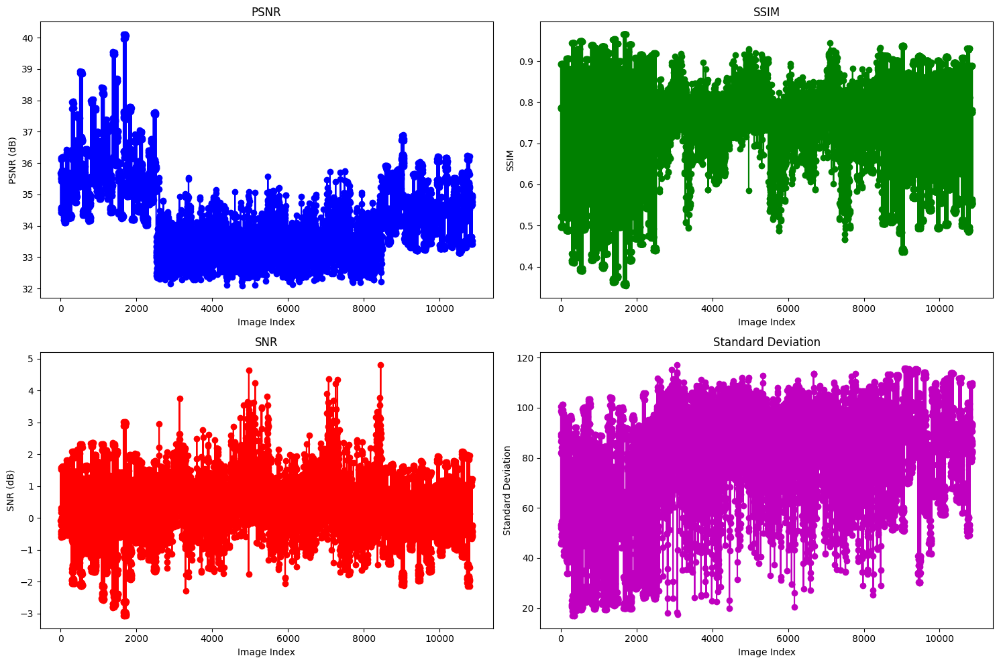

In [ ]:
def plot_metrics(psnr_values, ssim_values, snr_values, stddev_values):
    num_images = len(psnr_values)
    image_indices = np.arange(1, num_images + 1)

    plt.figure(figsize=(15, 10))

    # Plot PSNR
    plt.subplot(2, 2, 1)
    plt.plot(image_indices, psnr_values, marker='o', linestyle='-', color='b')
    plt.title('PSNR')
    plt.xlabel('Image Index')
    plt.ylabel('PSNR (dB)')

    # Plot SSIM
    plt.subplot(2, 2, 2)
    plt.plot(image_indices, ssim_values, marker='o', linestyle='-', color='g')
    plt.title('SSIM')
    plt.xlabel('Image Index')
    plt.ylabel('SSIM')

    # Plot SNR
    plt.subplot(2, 2, 3)
    plt.plot(image_indices, snr_values, marker='o', linestyle='-', color='r')
    plt.title('SNR')
    plt.xlabel('Image Index')
    plt.ylabel('SNR (dB)')

    # Plot Standard Deviation
    plt.subplot(2, 2, 4)
    plt.plot(image_indices, stddev_values, marker='o', linestyle='-', color='m')
    plt.title('Standard Deviation')
    plt.xlabel('Image Index')
    plt.ylabel('Standard Deviation')

    plt.tight_layout()
    plt.show()

# Plot metrics
plot_metrics(psnr_values, ssim_values, snr_values, stddev_values)


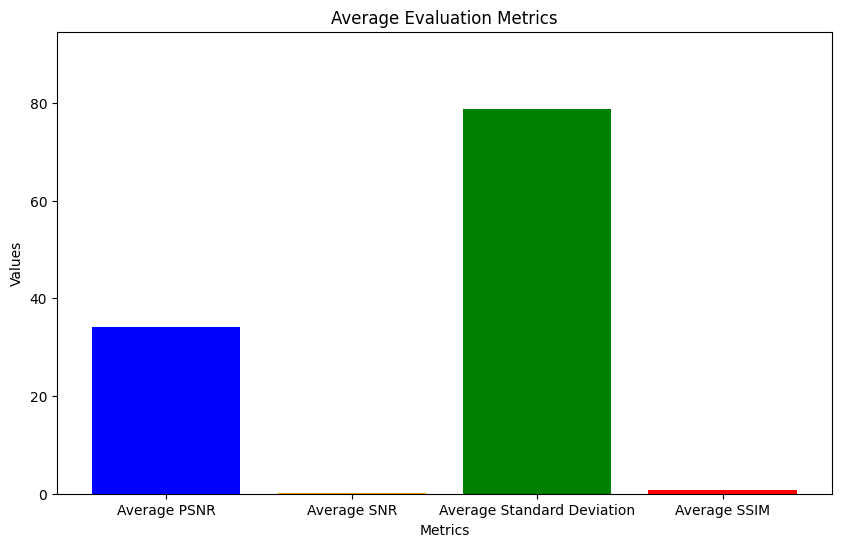

In [ ]:
# Plotting the average metrics
average_metrics = {
    'Average PSNR': average_psnr,
    'Average SNR': average_snr,
    'Average Standard Deviation': average_stddev,
    'Average SSIM': average_ssim
}

plt.figure(figsize=(10, 6))
plt.bar(average_metrics.keys(), average_metrics.values(), color=['blue', 'orange', 'green', 'red'])
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Average Evaluation Metrics')
plt.ylim([0, max(average_metrics.values()) * 1.2])
plt.show()


Threshold

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

def thresholding_segmentation(image, threshold_value=127):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding
    _, segmented_image = cv2.threshold(gray, threshold_value, 220, cv2.THRESH_BINARY)

    return segmented_image

def segment_and_save_images(input_dir, output_dir, threshold_value=127):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for filename in os.listdir(input_dir):
        img_path = os.path.join(input_dir, filename)
        image = cv2.imread(img_path)

        if image is not None:
            segmented_image = thresholding_segmentation(image, threshold_value=threshold_value)
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, segmented_image)

def display_images(original_dir, segmented_dir, num_images=10):
    original_images = sorted(os.listdir(original_dir))
    segmented_images = sorted(os.listdir(segmented_dir))

    for i, (original_image, segmented_image) in enumerate(zip(original_images, segmented_images)):
        if i >= num_images:
            break

        orig_path = os.path.join(original_dir, original_image)
        seg_path = os.path.join(segmented_dir, segmented_image)

        original = cv2.imread(orig_path)
        segmented = cv2.imread(seg_path)

        # Convert BGR to RGB for displaying
        original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
        segmented = cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(original)
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(segmented)
        plt.title('Segmented Image')

        plt.show()

# Directories
input_dir_benign = '/content/CLAHE_Algo/Benign Masses'
output_dir_benign = 'Thresh_seg/Benign Masses'
input_dir_malignant = '/content/CLAHE_Algo/Malignant Masses'
output_dir_malignant = 'Thresh_seg/Malignant Masses'

# Segment and save images
segment_and_save_images(input_dir_benign, output_dir_benign, threshold_value=127)
segment_and_save_images(input_dir_malignant, output_dir_malignant, threshold_value=127)




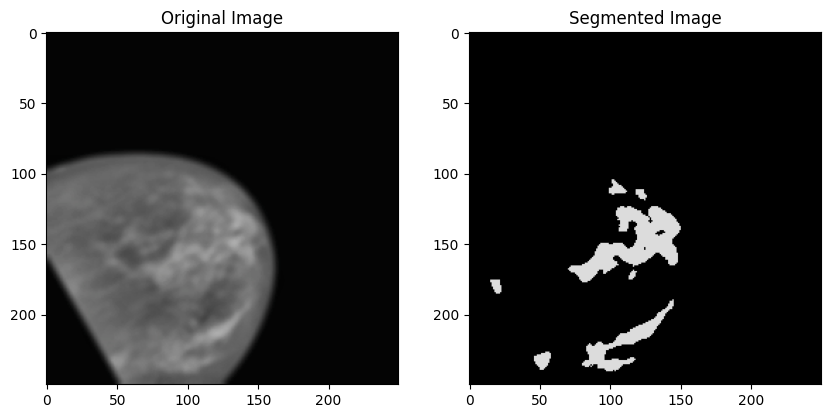

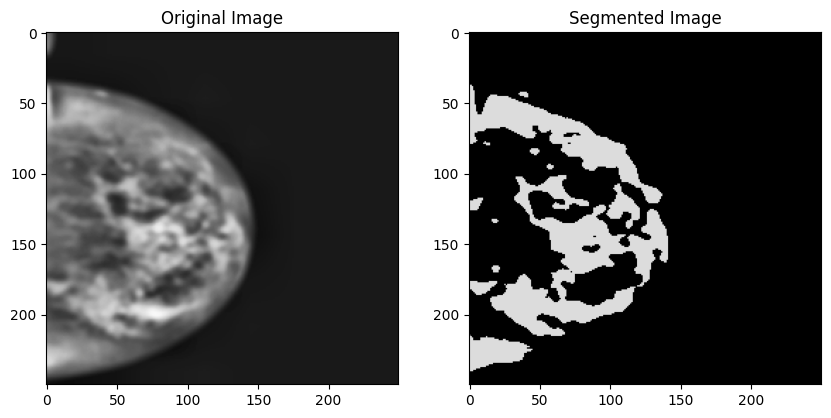

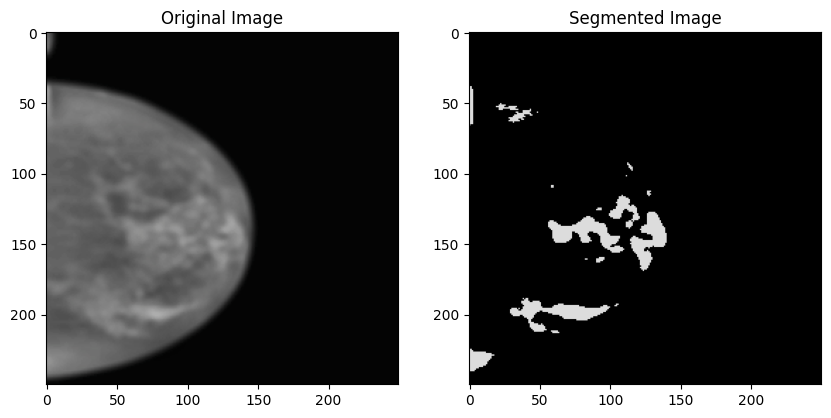

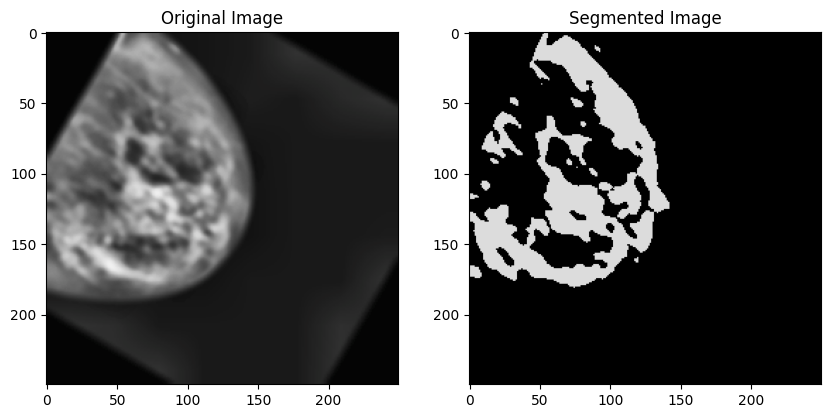

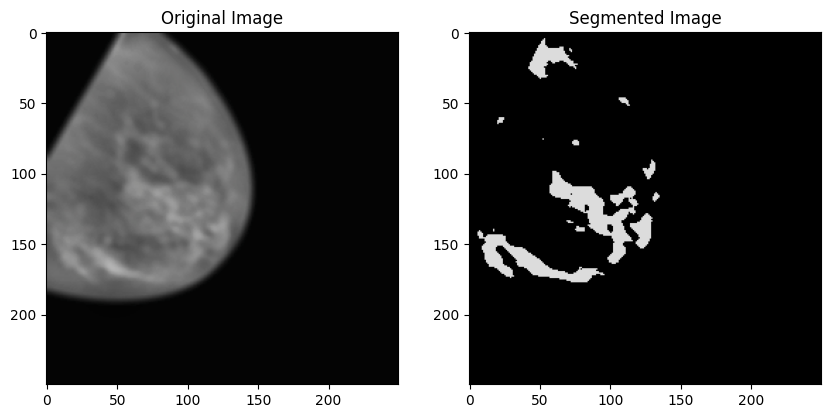

...

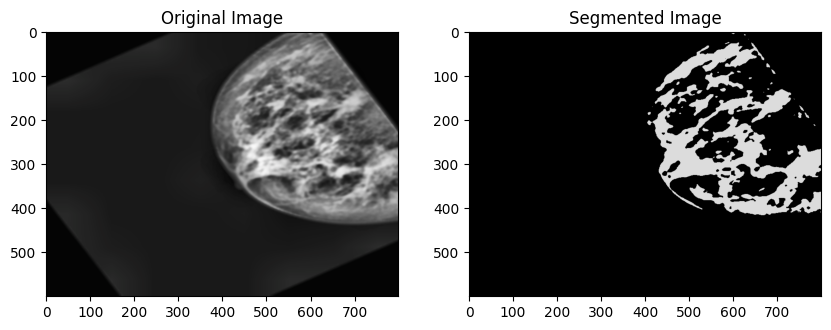

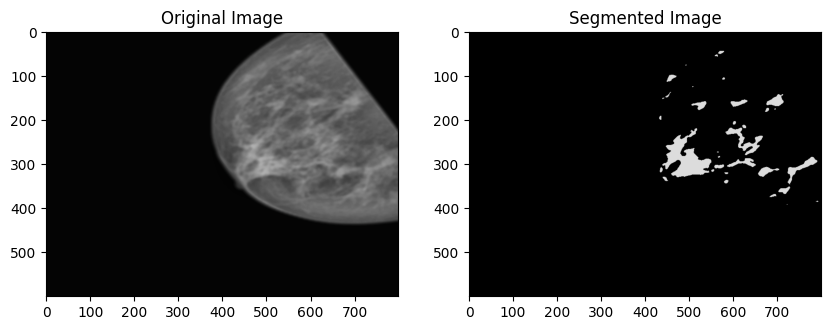

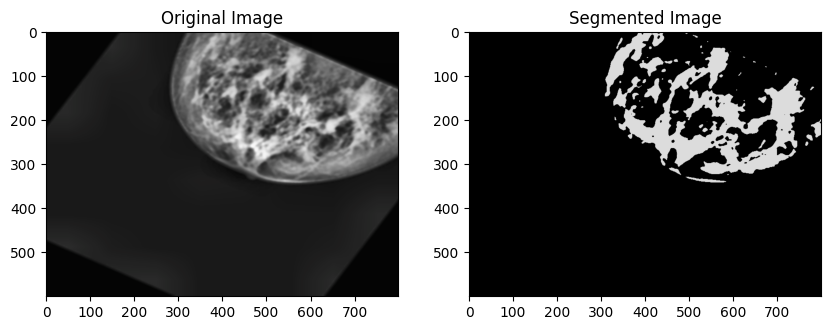

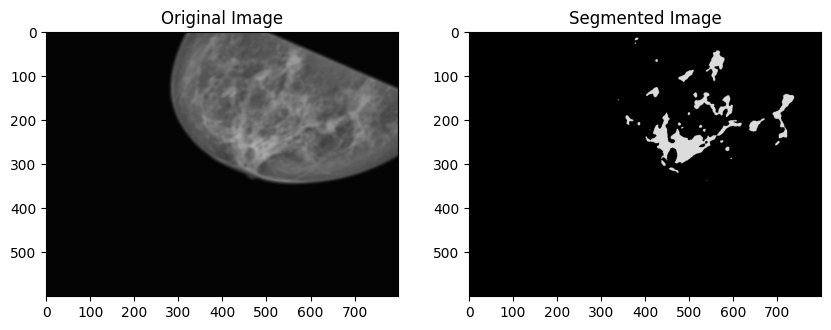

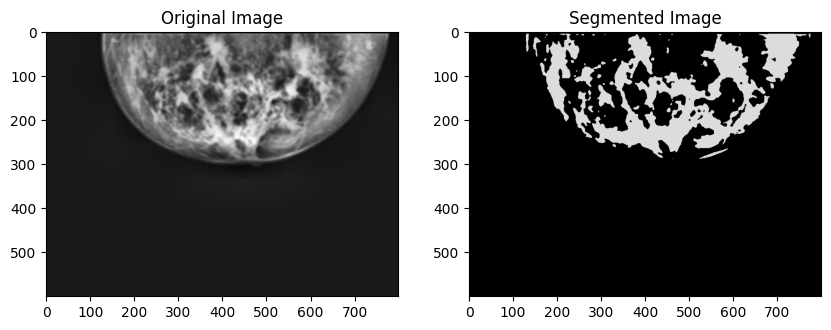

In [ ]:
# Display only 10 segmented images for benign
display_images(input_dir_benign, output_dir_benign, num_images=10)

# Display only 10 segmented images for malignant
display_images(input_dir_malignant, output_dir_malignant, num_images=10)

**DATA SPLITTING**

In [ ]:
import os

directory_name = 'Data Split'  # Store the directory name in a variable
os.makedirs(directory_name, exist_ok=True)  # Use makedirs to create the directory

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

def split_data(source_dir, train_dir, val_dir, test_dir, split_ratio=(0.6, 0.2, 0.2)):
    files = os.listdir(source_dir)
    train_files, temp_files = train_test_split(files, test_size=(1 - split_ratio[0]))
    val_files, test_files = train_test_split(temp_files, test_size=split_ratio[2]/(split_ratio[1]+split_ratio[2]))

    # Create the necessary directories within train_dir, val_dir and test_dir
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    for file in train_files:
        shutil.copy(os.path.join(source_dir, file), os.path.join(train_dir, file))

    for file in val_files:
        shutil.copy(os.path.join(source_dir, file), os.path.join(val_dir, file))

    for file in test_files:
        shutil.copy(os.path.join(source_dir, file), os.path.join(test_dir, file))


# Define directories
source_dir_benign = '/content/Thresh_seg/Benign Masses'
source_dir_malignant = '/content/Thresh_seg/Malignant Masses'
train_dir = '/content/Thresh_seg/train'
val_dir = '/content/Thresh_seg/val'
test_dir = '/content/Thresh_seg/test'

# Split data
split_data(source_dir_benign, os.path.join(train_dir, 'Benign Masses'), os.path.join(val_dir, 'Benign Masses'), os.path.join(test_dir, 'Benign Masses')) # Changed 'Begnin Masses' to 'Benign Masses'
split_data(source_dir_malignant, os.path.join(train_dir, 'Malignant Masses'), os.path.join(val_dir, 'Malignant Masses'), os.path.join(test_dir, 'Malignant Masses'))

In [ ]:
def count_files_in_directory(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Directory path
directory_path = '/content/Thresh_seg/test/Benign Masses'
file_count_test_benign = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_test_benign}")

# Directory path
directory_path = '/content/Thresh_seg/test/Malignant Masses'
file_count_test_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_test_malignant}")

test_files = file_count_test_benign + file_count_test_malignant
print(f"Total Number of files in testing set : {test_files}")

# Directory path
directory_path = '/content/Thresh_seg/train/Benign Masses'
file_count_train_bening = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_train_bening}")

# Directory path
directory_path = '/content/Thresh_seg/train/Malignant Masses'
file_count_train_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_train_malignant}")

train_files = file_count_train_bening + file_count_train_malignant
print(f"Total Number of files in training set : {train_files}")

# Directory path
directory_path = '/content/Thresh_seg/val/Benign Masses'
file_count_val_bening = count_files_in_directory(directory_path)
print(f"\nNumber of files in '{directory_path}': {file_count_val_bening}")

# Directory path
directory_path = '/content/Thresh_seg/val/Malignant Masses'
file_count_val_malignant = count_files_in_directory(directory_path)
print(f"Number of files in '{directory_path}': {file_count_val_malignant}")
val_files = file_count_val_bening + file_count_val_malignant
print(f"\nTotal Number of files in validation : {val_files}")

total= train_files+val_files+test_files
print(f"\nTotal Number of files in the dataset splitted : {total}")


#percentage of each set after the split
print(f"\nPercentage of training set : {round((train_files/total)*100,2)}%")
print(f"Percentage of validation set : {round((val_files/total)*100,2)}%")
print(f"Percentage of test set : {round((test_files/total)*100,2)}%")


Number of files in '/content/Thresh_seg/test/Benign Masses': 2174
Number of files in '/content/Thresh_seg/test/Malignant Masses': 2742
Total Number of files in testing set : 4916
Number of files in '/content/Thresh_seg/train/Benign Masses': 6519
Number of files in '/content/Thresh_seg/train/Malignant Masses': 8226
Total Number of files in training set : 14745

Number of files in '/content/Thresh_seg/val/Benign Masses': 2173
Number of files in '/content/Thresh_seg/val/Malignant Masses': 2742

Total Number of files in validation : 4915

Total Number of files in the dataset splitted : 24576

Percentage of training set : 60.0%
Percentage of validation set : 20.0%
Percentage of test set : 20.0%


**Feature Extraction Methods**


Local Binary Pattern

In [ ]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from sklearn.preprocessing import StandardScaler

def extract_lbp_features(image, P=8, R=1):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    lbp = local_binary_pattern(gray_image, P, R, method='uniform')
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, P + 3), range=(0, P + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)
    return hist

import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from sklearn.preprocessing import StandardScaler

# Parameters for LBP
P = 8  # Number of circularly symmetric neighbour set points
R = 1  # Radius of the circle

# Function to extract LBP features from an image
def extract_features(directory):
    features = []
    labels = []
    # Use the correct subdirectory names
    for subdir, label in [('Benign Masses', 0), ('Malignant Masses', 1)]:
        subdir_path = os.path.join(directory, subdir)
        for filename in os.listdir(subdir_path):
            filepath = os.path.join(subdir_path, filename)
            image = cv2.imread(filepath)
            if image is not None:
                feature = extract_lbp_features(image)
                features.append(feature)
                labels.append(label)
    return np.array(features), np.array(labels)

X_train, y_train = extract_features(train_dir)
X_val, y_val = extract_features(val_dir)
X_test, y_test = extract_features(test_dir)

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [ ]:

# Load an example image
image_path = '/content/Thresh_seg/Malignant Masses/20586986 (14).png'
image = cv2.imread(image_path)

# Extract LBP features
lbp_features = extract_lbp_features(image, P, R)

# The number of LBP features
num_features = len(lbp_features)
print(f'Number of LBP features extracted: {num_features}')


**Models-**
**1.KNN**

**2.Random Forest**

**3. Decision Tree**

**4. X Gradient Booster**

**5. SVM**

**6. Naive Bayes**

**7. CNN**

**8. RNN**


**KNN Classification**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Train KNN
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)


KNeighborsClassifier(n_neighbors=3)

KNN Accuracy: 0.8844589096826688
KNN Precision: 0.8682249322493225
KNN Recall: 0.9347191830780452
KNN F1 Score: 0.9002458728486127
KNN Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.82      0.86      2174
           1       0.87      0.93      0.90      2742

    accuracy                           0.88      4916
   macro avg       0.89      0.88      0.88      4916
weighted avg       0.89      0.88      0.88      4916



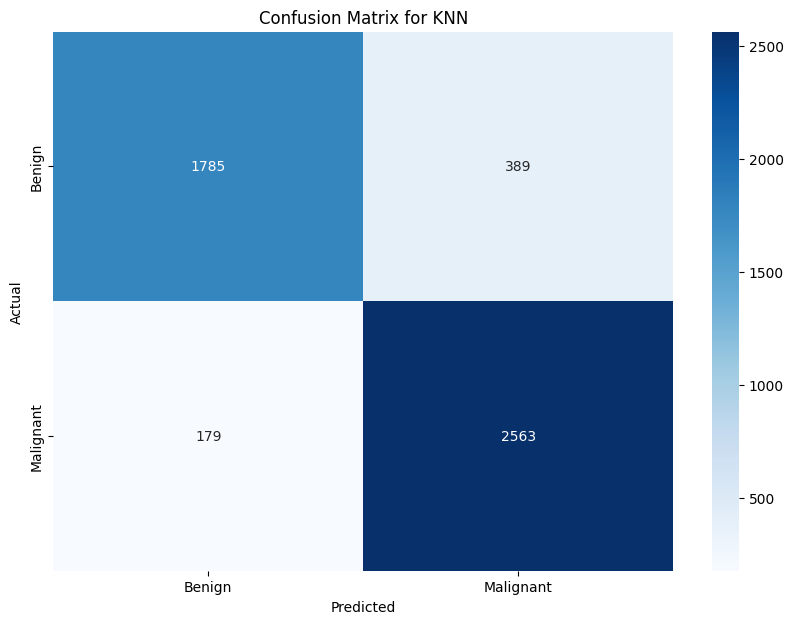

In [ ]:

# Evaluate KNN
y_pred = knn.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f'KNN Accuracy: {accuracy}')
print(f'KNN Precision: {precision}')
print(f'KNN Recall: {recall}')
print(f'KNN F1 Score: {f1}')
print(f'KNN Classification Report:\n {classification_report(y_test, y_pred)}')

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for KNN')
plt.show()


**SVM**

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc

# Train SVM
svm_model = SVC(probability=True) # You can adjust the kernel and other parameters
svm_model.fit(X_train, y_train)


SVC(probability=True)

SVM Accuracy: 0.8759153783563873
SVM Precision: 0.8461038961038961
SVM Recall: 0.950401167031364
SVM F1 Score: 0.895225008588114
SVM ROC AUC: 0.9363342351790975
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.54      0.62      2174
           1       0.70      0.83      0.76      2742

    accuracy                           0.70      4916
   macro avg       0.71      0.69      0.69      4916
weighted avg       0.71      0.70      0.70      4916



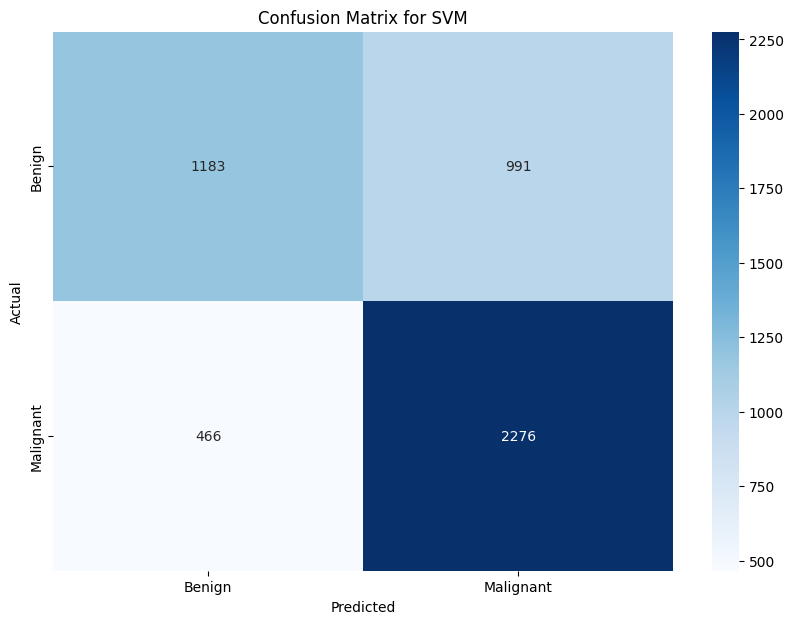

In [ ]:
# Evaluate SVM
y_pred_svm = svm_model.predict(X_test)
y_pred_proba_svm = svm_model.predict_proba(X_test)[:, 1]

accuracy_svm = accuracy_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm)
recall_svm = recall_score(y_test, y_pred_svm)
f1_svm = f1_score(y_test, y_pred_svm)
roc_auc_svm = auc(*roc_curve(y_test, y_pred_proba_svm)[:2])

print(f'SVM Accuracy: {accuracy_svm}')
print(f'SVM Precision: {precision_svm}')
print(f'SVM Recall: {recall_svm}')
print(f'SVM F1 Score: {f1_svm}')
print(f'SVM ROC AUC: {roc_auc_svm}')
print(f'SVM Classification Report:\n {classification_report(y_test, y_pred)}')

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for SVM')
plt.show()


Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

Random Forest Accuracy: 0.9831163547599675
Random Forest Precision: 0.9904094430099595
Random Forest Recall: 0.9792122538293216
Random Forest F1 Score: 0.9847790207225381
Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      2174
           1       0.99      0.98      0.98      2742

    accuracy                           0.98      4916
   macro avg       0.98      0.98      0.98      4916
weighted avg       0.98      0.98      0.98      4916



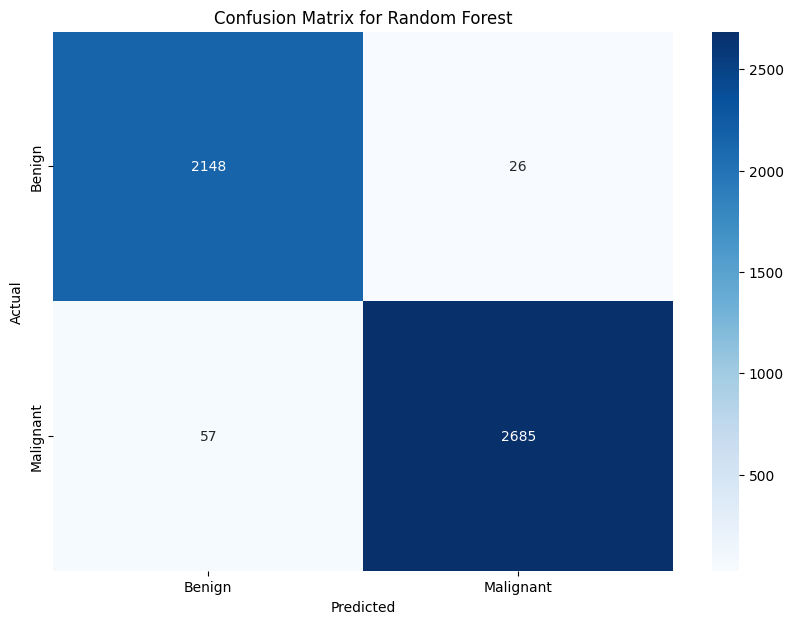

In [ ]:

# Evaluate Random Forest
y_pred_rf = rf.predict(X_test)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)

print(f'Random Forest Accuracy: {accuracy_rf}')
print(f'Random Forest Precision: {precision_rf}')
print(f'Random Forest Recall: {recall_rf}')
print(f'Random Forest F1 Score: {f1_rf}')
print(f'Random Forest Classification Report:\n {classification_report(y_test, y_pred_rf)}')

# Plot confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest')
plt.show()


In [ ]:
from sklearn.tree import export_graphviz
import pydot

# Visualize one of the trees in the random forest
estimator = rf.estimators_[0]

# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                feature_names=[f'feature_{i}' for i in range(X_train.shape[1])],
                class_names=['Benign', 'Malignant'],
                rounded=True, proportion=False,
                precision=2, filled=True)

# Convert to png using system command (requires Graphviz)
(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('Random_Forest.png')

# Display the image
from IPython.display import Image
Image(filename='Random_Forest.png')


Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Train Decision Tree
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

Decision Tree Accuracy: 0.9922701383238405
Decision Tree Precision: 0.9941520467836257
Decision Tree Recall: 0.9919766593727206
Decision Tree F1 Score: 0.9930631617378606
Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      2174
           1       0.99      0.99      0.99      2742

    accuracy                           0.99      4916
   macro avg       0.99      0.99      0.99      4916
weighted avg       0.99      0.99      0.99      4916



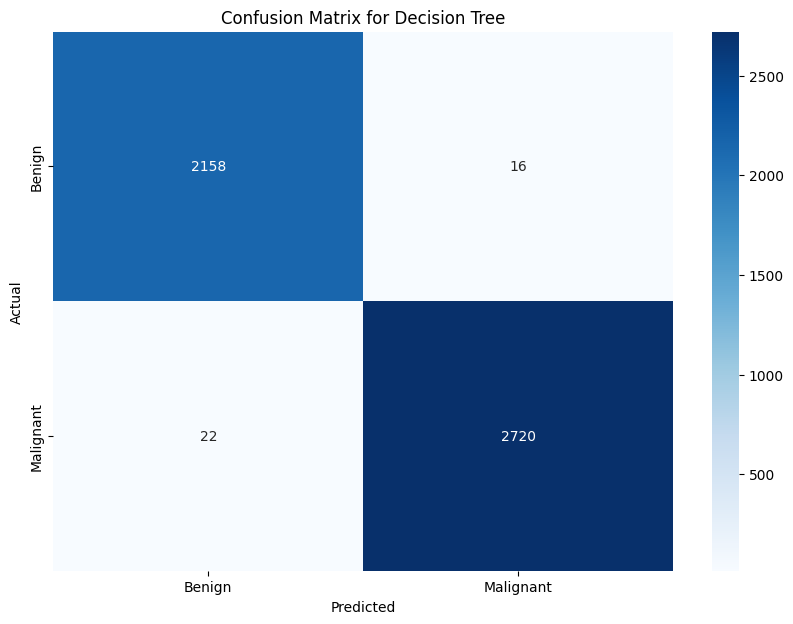

In [ ]:
# Evaluate Decision Tree
y_pred_dt = dt.predict(X_test)
accuracy_dt = accuracy_score(y_test, y_pred_dt)
precision_dt = precision_score(y_test, y_pred_dt)
recall_dt = recall_score(y_test, y_pred_dt)
f1_dt = f1_score(y_test, y_pred_dt)

print(f'Decision Tree Accuracy: {accuracy_dt}')
print(f'Decision Tree Precision: {precision_dt}')
print(f'Decision Tree Recall: {recall_dt}')
print(f'Decision Tree F1 Score: {f1_dt}')
print(f'Decision Tree Classification Report:\n {classification_report(y_test, y_pred_dt)}')

# Plot confusion matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Tree')
plt.show()


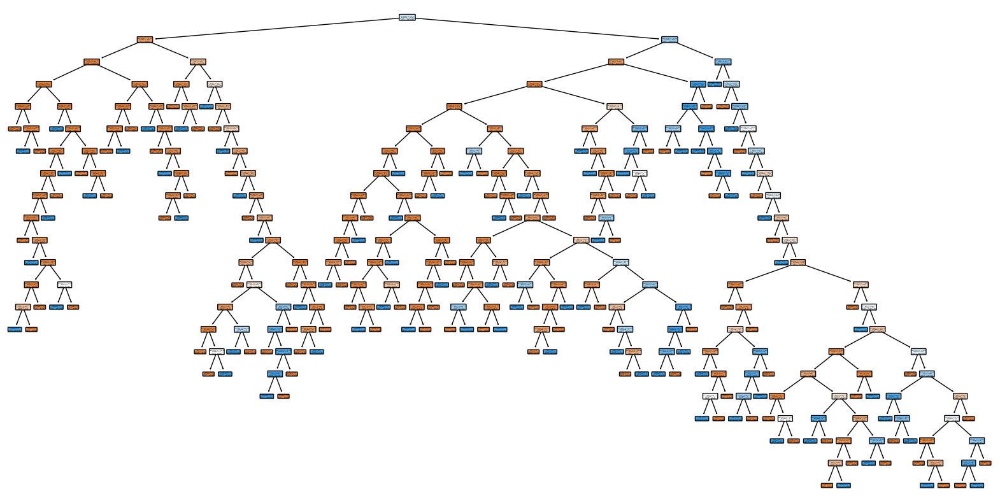

In [ ]:
from sklearn.tree import plot_tree

# Visualize the Decision Tree
plt.figure(figsize=(20, 10))
plot_tree(dt, filled=True, feature_names=[f'feature_{i}' for i in range(X_train.shape[1])], class_names=['Benign', 'Malignant'], rounded=True)
plt.show()


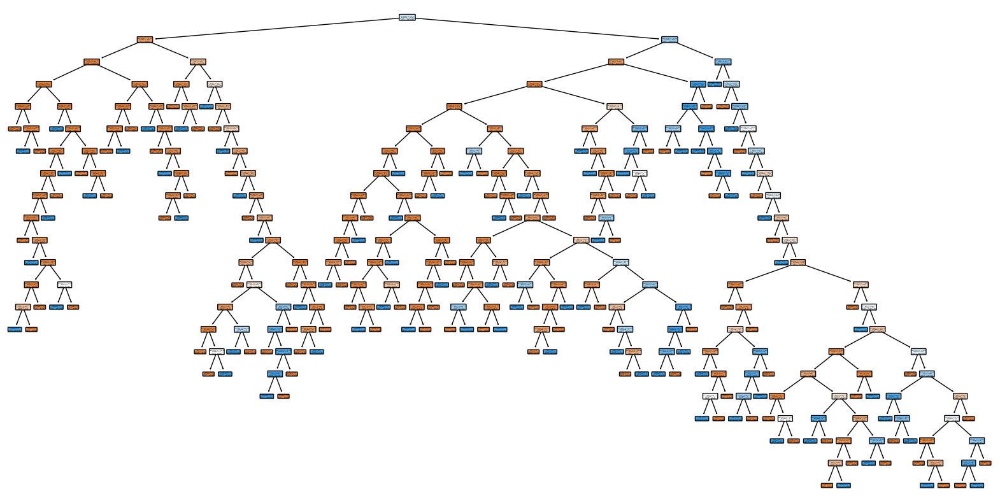

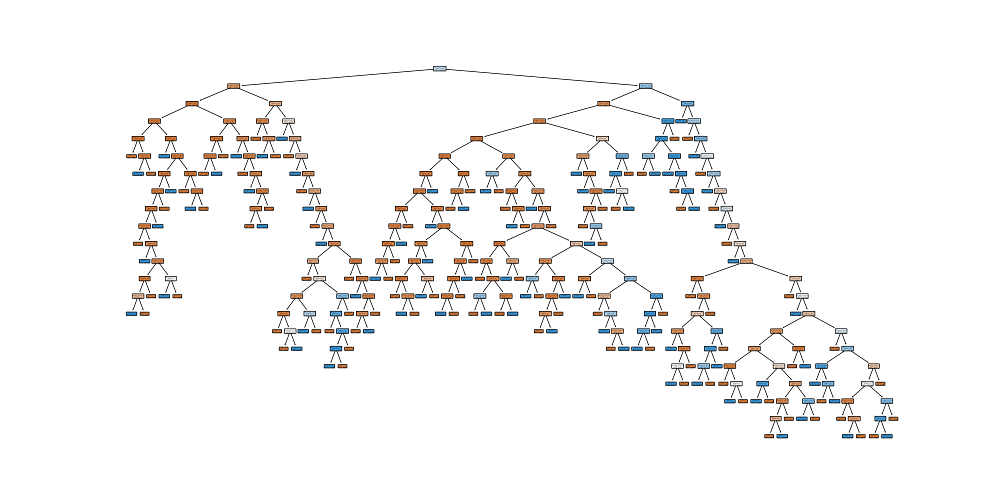

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Plot and save the Decision Tree visualization
plt.figure(figsize=(20, 10))
plot_tree(dt, filled=True, feature_names=[f'feature_{i}' for i in range(X_train.shape[1])], class_names=['Benign', 'Malignant'], rounded=True)
plt.savefig('decision_tree.png')
plt.show()

# Display the image
Image(filename='decision_tree.png')


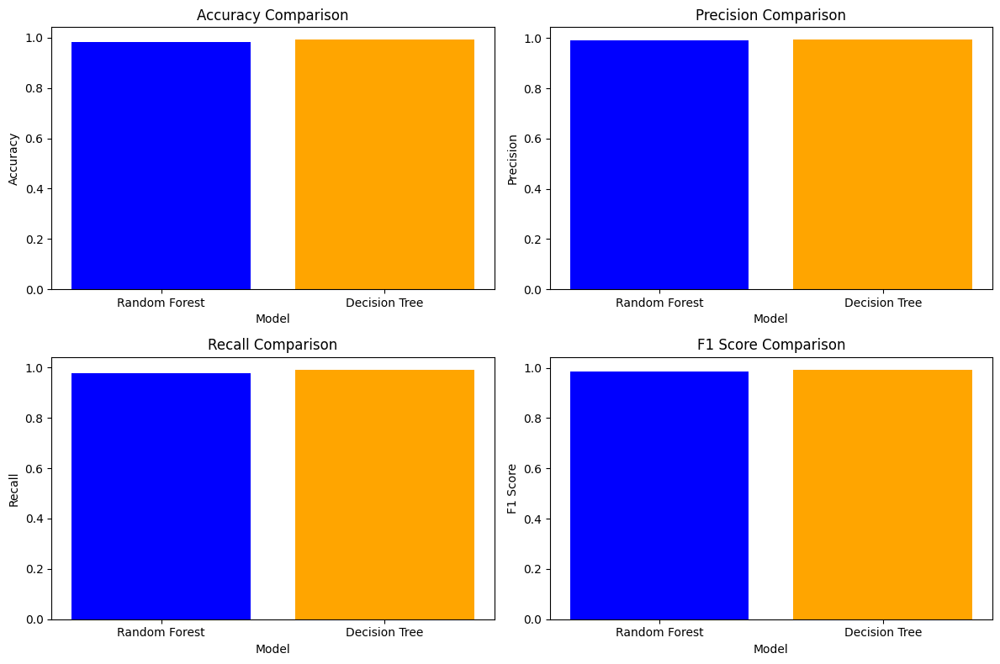

In [ ]:
# Collect evaluation metrics
models = ['Random Forest', 'Decision Tree']
accuracies = [accuracy_rf, accuracy_dt]
precisions = [precision_rf, precision_dt]
recalls = [recall_rf, recall_dt]
f1_scores = [f1_rf, f1_dt]

# Plot the metrics
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.bar(models, accuracies, color=['blue', 'orange'])
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')

plt.subplot(2, 2, 2)
plt.bar(models, precisions, color=['blue', 'orange'])
plt.xlabel('Model')
plt.ylabel('Precision')
plt.title('Precision Comparison')

plt.subplot(2, 2, 3)
plt.bar(models, recalls, color=['blue', 'orange'])
plt.xlabel('Model')
plt.ylabel('Recall')
plt.title('Recall Comparison')

plt.subplot(2, 2, 4)
plt.bar(models, f1_scores, color=['blue', 'orange'])
plt.xlabel('Model')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison')

plt.tight_layout()
plt.show()


In [ ]:
!pip install joblib
!pip install graphviz pydot


In [ ]:
import joblib

# Save KNN model
joblib.dump(knn, 'knn_model.pkl')

# Save SVM model
joblib.dump(svm, 'svm_model.pkl')

# Save Random Forest model
joblib.dump(rf, 'random_forest_model.pkl')

# Save Decision Tree model
joblib.dump(dt, 'decision_tree_model.pkl')

# Verify saving
print("Models saved successfully.")


Models saved successfully.


Downloading Models

In [ ]:
from google.colab import files

# Download models
files.download('knn_model.pkl')
files.download('svm_model.pkl')
files.download('random_forest_model.pkl')
files.download('decision_tree_model.pkl')

# Download images
files.download('random_forest_tree.png')
files.download('decision_tree.png')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

X Gradient Booster

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [13:00:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Accuracy: 0.9987794955248169
XGBoost Precision: 0.9992700729927008
XGBoost Recall: 0.9985412107950401
XGBoost F1 Score: 0.9989055089383437
XGBoost ROC AUC: 0.9999449766721221


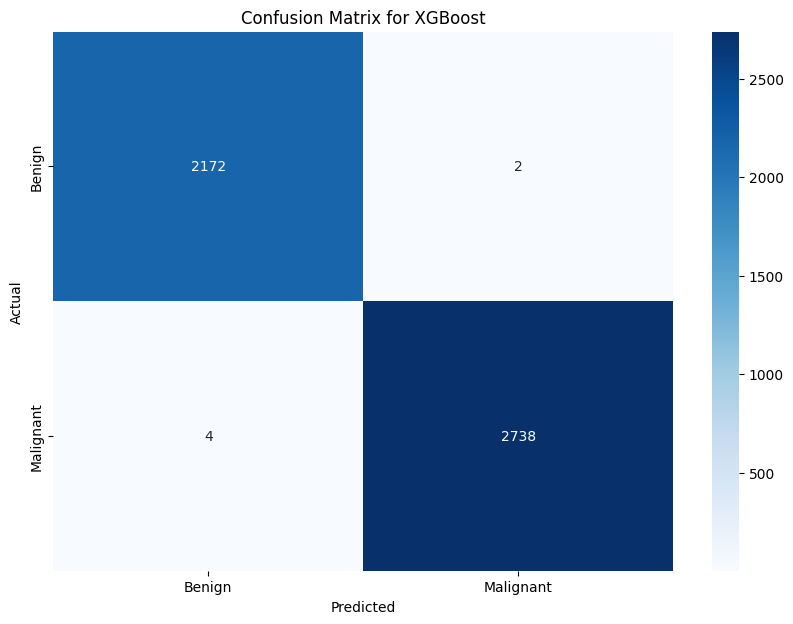

In [ ]:
import xgboost as xgb
from sklearn.metrics import roc_curve, auc, precision_recall_curve

# Train XGBoost
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train, y_train)

# Evaluate XGBoost
y_pred_xgb = xgb_model.predict(X_test)
y_pred_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]

accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
precision_xgb = precision_score(y_test, y_pred_xgb)
recall_xgb = recall_score(y_test, y_pred_xgb)
f1_xgb = f1_score(y_test, y_pred_xgb)
roc_auc_xgb = auc(*roc_curve(y_test, y_pred_proba_xgb)[:2])
precision_recall_xgb = precision_recall_curve(y_test, y_pred_proba_xgb)

print(f'XGBoost Accuracy: {accuracy_xgb}')
print(f'XGBoost Precision: {precision_xgb}')
print(f'XGBoost Recall: {recall_xgb}')
print(f'XGBoost F1 Score: {f1_xgb}')
print(f'XGBoost ROC AUC: {roc_auc_xgb}')

# Confusion Matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for XGBoost')
plt.show()


Naive bayes

Naive Bayes Accuracy: 0.7123677786818552
Naive Bayes Precision: 0.7068535825545171
Naive Bayes Recall: 0.8274981765134938
Naive Bayes F1 Score: 0.7624327956989247
Naive Bayes ROC AUC: 0.7868309045902204


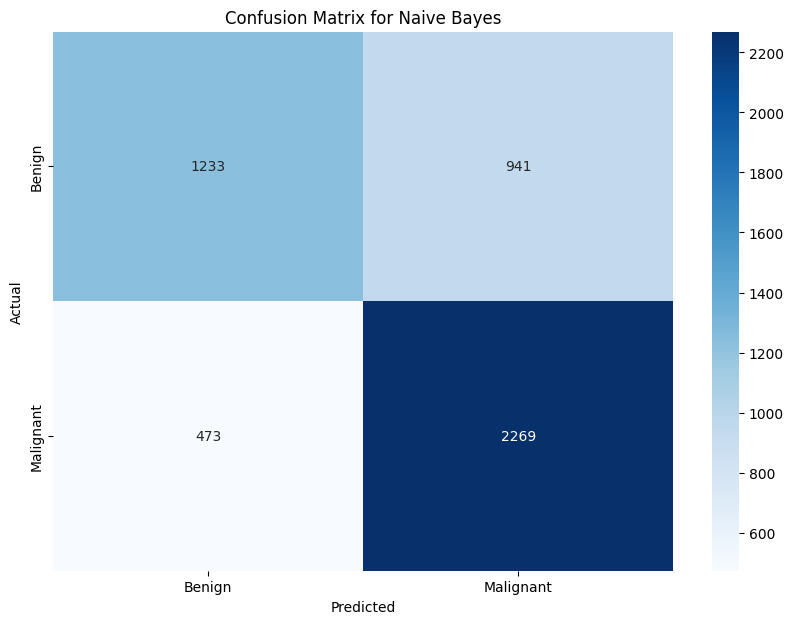

In [ ]:
from sklearn.naive_bayes import GaussianNB

# Train Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

# Evaluate Naive Bayes
y_pred_nb = nb_model.predict(X_test)
y_pred_proba_nb = nb_model.predict_proba(X_test)[:, 1]

accuracy_nb = accuracy_score(y_test, y_pred_nb)
precision_nb = precision_score(y_test, y_pred_nb)
recall_nb = recall_score(y_test, y_pred_nb)
f1_nb = f1_score(y_test, y_pred_nb)
roc_auc_nb = auc(*roc_curve(y_test, y_pred_proba_nb)[:2])
precision_recall_nb = precision_recall_curve(y_test, y_pred_proba_nb)

print(f'Naive Bayes Accuracy: {accuracy_nb}')
print(f'Naive Bayes Precision: {precision_nb}')
print(f'Naive Bayes Recall: {recall_nb}')
print(f'Naive Bayes F1 Score: {f1_nb}')
print(f'Naive Bayes ROC AUC: {roc_auc_nb}')

# Confusion Matrix
cm_nb = confusion_matrix(y_test, y_pred_nb)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_nb, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Naive Bayes')
plt.show()


KNN Accuracy: 0.8816110659072417
KNN Precision: 0.856906807666887
KNN Recall: 0.9456601021152443
KNN F1 Score: 0.8990984743411927
KNN ROC AUC: 0.9472108205387321


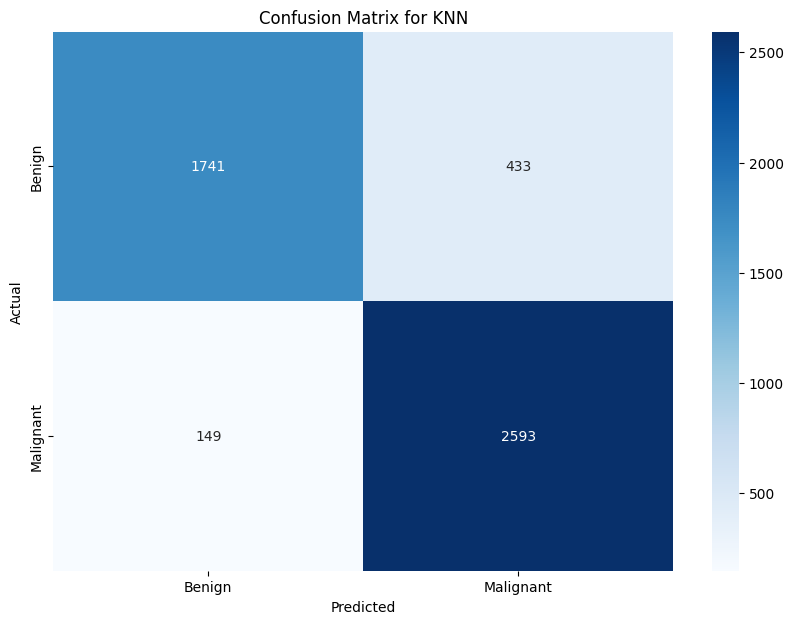

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming you have X_train, y_train, X_test, and y_test defined

# Train KNN
knn_model = KNeighborsClassifier(n_neighbors=5) # You can adjust n_neighbors
knn_model.fit(X_train, y_train)

# Evaluate KNN
y_pred_knn = knn_model.predict(X_test)
y_pred_proba_knn = knn_model.predict_proba(X_test)[:, 1]

accuracy_knn = accuracy_score(y_test, y_pred_knn)
precision_knn = precision_score(y_test, y_pred_knn)
recall_knn = recall_score(y_test, y_pred_knn)
f1_knn = f1_score(y_test, y_pred_knn)
roc_auc_knn = auc(*roc_curve(y_test, y_pred_proba_knn)[:2])
precision_recall_knn = precision_recall_curve(y_test, y_pred_proba_knn)

print(f'KNN Accuracy: {accuracy_knn}')
print(f'KNN Precision: {precision_knn}')
print(f'KNN Recall: {recall_knn}')
print(f'KNN F1 Score: {f1_knn}')
print(f'KNN ROC AUC: {roc_auc_knn}')

# Confusion Matrix
cm_knn = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for KNN')
plt.show()

<Figure size 1200x800 with 0 Axes>

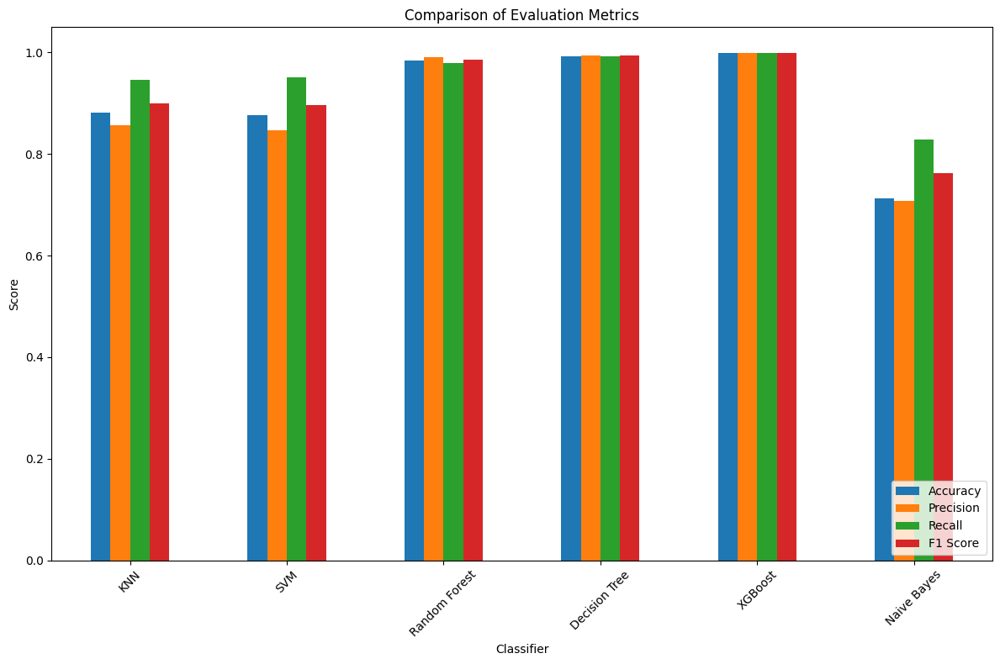

In [ ]:
# Metrics for comparison
metrics = {
    'KNN': [accuracy_knn, precision_knn, recall_knn, f1_knn],
    'SVM': [accuracy_svm, precision_svm, recall_svm, f1_svm],
    'Random Forest': [accuracy_rf, precision_rf, recall_rf, f1_rf],
    'Decision Tree': [accuracy_dt, precision_dt, recall_dt, f1_dt],
    'XGBoost': [accuracy_xgb, precision_xgb, recall_xgb, f1_xgb],
    'Naive Bayes': [accuracy_nb, precision_nb, recall_nb, f1_nb]
}

# Convert metrics to DataFrame
import pandas as pd
metrics_df = pd.DataFrame(metrics, index=['Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Plotting the metrics
plt.figure(figsize=(12, 8))
metrics_df.T.plot(kind='bar', figsize=(12, 8))
plt.title('Comparison of Evaluation Metrics')
plt.ylabel('Score')
plt.xlabel('Classifier')
plt.xticks(rotation=45)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


Evaluation Comparison

In [ ]:
# Collect evaluation metrics
models = ['KNN', 'SVM', 'Random Forest', 'Decision Tree','XGBoost','Naive Bayes']
accuracies = [accuracy_score(y_test, knn.predict(X_test)),
              accuracy_score(y_test, svm.predict(X_test)),
              accuracy_score(y_test, rf.predict(X_test)),
              accuracy_score(y_test, dt.predict(X_test))]

precisions = [precision_score(y_test, knn.predict(X_test)),
              precision_score(y_test, svm.predict(X_test)),
              precision_score(y_test, rf.predict(X_test)),
              precision_score(y_test, dt.predict(X_test))]

recalls = [recall_score(y_test, knn.predict(X_test)),
           recall_score(y_test, svm.predict(X_test)),
           recall_score(y_test, rf.predict(X_test)),
           recall_score(y_test, dt.predict(X_test))]

f1_scores = [f1_score(y_test, knn.predict(X_test)),
             f1_score(y_test, svm.predict(X_test)),
             f1_score(y_test, rf.predict(X_test)),
             f1_score(y_test, dt.predict(X_test))]


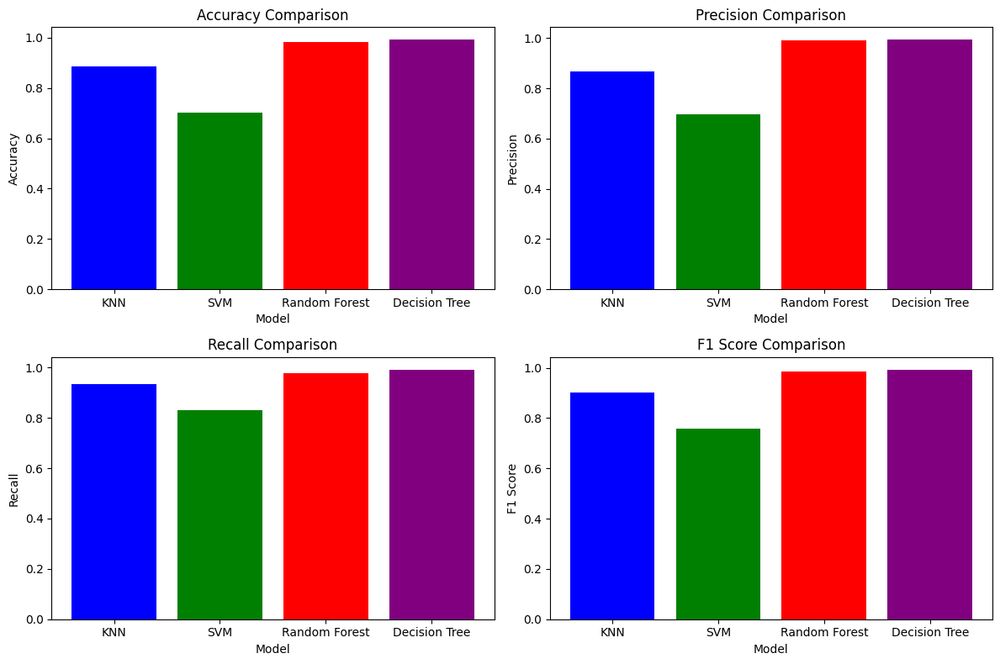

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt

# Plot the metrics
plt.figure(figsize=(12, 8))

# Plot accuracies
plt.subplot(2, 2, 1)
#The models and accuracies lists need to be the same length
plt.bar(models[:4], accuracies, color=['blue', 'green', 'red', 'purple']) #Use only the first 4 elements of models to match the length of accuracies
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')

# Plot precisions
plt.subplot(2, 2, 2)
plt.bar(models[:4], precisions, color=['blue', 'green', 'red', 'purple']) #Use only the first 4 elements of models to match the length of precisions
plt.xlabel('Model')
plt.ylabel('Precision')
plt.title('Precision Comparison')

# Plot recalls
plt.subplot(2, 2, 3)
plt.bar(models[:4], recalls, color=['blue', 'green', 'red', 'purple']) #Use only the first 4 elements of models to match the length of recalls
plt.xlabel('Model')
plt.ylabel('Recall')
plt.title('Recall Comparison')

# Plot F1 scores
plt.subplot(2, 2, 4)
plt.bar(models[:4], f1_scores, color=['blue', 'green', 'red', 'purple']) #Use only the first 4 elements of models to match the length of f1_scores
plt.xlabel('Model')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison')

plt.tight_layout()
plt.savefig('model_comparison.png')
plt.show()
from google.colab import files

# Download the comparison graph
files.download('model_comparison.png')

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate the ROC curve and AUC score
fpr, tpr, _ = roc_curve(y_test, model.predict_proba(X_test)[:, 1])
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])

# Plot the ROC curve
plt.figure(figsize=(10, 7))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

AttributeError: 'Sequential' object has no attribute 'predict_proba'

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate the Precision-Recall curve
precision, recall, _ = precision_recall_curve(y_test, model.predict_proba(X_test)[:, 1])
average_precision = average_precision_score(y_test, model.predict_proba(X_test)[:, 1])

# Plot the Precision-Recall curve
plt.figure(figsize=(10, 7))
plt.plot(recall, precision, color='blue', lw=2, label=f'Precision-Recall curve (AP = {average_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()


In [ ]:
# Visualizing feature importance
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

# Assuming feature names are available
feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]  # Replace with actual feature names if available

# Plot the feature importance
plt.figure(figsize=(12, 6))
plt.title('Feature Importances')
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()


**CNN**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# Define CNN model
cnn = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:




# Data generators for training and validation
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    'path/to/train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
    'path/to/validation',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

# Train the CNN model
history_cnn = cnn.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)

# Evaluate the CNN model
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    'path/to/test',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

y_pred_cnn = cnn.predict(test_generator)
y_pred_cnn = (y_pred_cnn > 0.5).astype(int)
y_true = test_generator.classes

accuracy_cnn = accuracy_score(y_true, y_pred_cnn)
precision_cnn = precision_score(y_true, y_pred_cnn)
recall_cnn = recall_score(y_true, y_pred_cnn)
f1_cnn = f1_score(y_true, y_pred_cnn)

print(f'CNN Accuracy: {accuracy_cnn}')
print(f'CNN Precision: {precision_cnn}')
print(f'CNN Recall: {recall_cnn}')
print(f'CNN F1 Score: {f1_cnn}')
print(f'CNN Classification Report:\n {classification_report(y_true, y_pred_cnn)}')

# Plot confusion matrix
cm_cnn = confusion_matrix(y_true, y_pred_cnn)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for CNN')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator


Setting up data Generators

In [ ]:
train_dir = '/content/Thresh_seg/train'
test_dir = '/content/Thresh_seg/test'
val_dir = '/content/Thresh_seg/val'

batch_size = 32
img_height = 224
img_width = 224

train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary'
)


Found 14745 images belonging to 2 classes.
Found 4915 images belonging to 2 classes.
Found 4916 images belonging to 2 classes.


Define the Model

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 26, 26, 128)      

Train The CNN

In [ ]:
epochs = 10

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=val_generator,
    validation_steps=val_generator.samples // batch_size,
    epochs=epochs
)


Epoch 1/10
460/460 [==============================] - 1941s 4s/step - loss: 0.4741 - accuracy: 0.7665 - val_loss: 0.3577 - val_accuracy: 0.8227
Epoch 2/10
460/460 [==============================] - 1957s 4s/step - loss: 0.3288 - accuracy: 0.8369 - val_loss: 0.3060 - val_accuracy: 0.8442
Epoch 3/10
460/460 [==============================] - 1961s 4s/step - loss: 0.2867 - accuracy: 0.8595 - val_loss: 0.3017 - val_accuracy: 0.8523
Epoch 4/10
460/460 [==============================] - 1876s 4s/step - loss: 0.2413 - accuracy: 0.8887 - val_loss: 0.2483 - val_accuracy: 0.8824
Epoch 5/10
460/460 [==============================] - 1949s 4s/step - loss: 0.1957 - accuracy: 0.9130 - val_loss: 0.2274 - val_accuracy: 0.9005
Epoch 6/10
460/460 [==============================] - 1863s 4s/step - loss: 0.1549 - accuracy: 0.9356 - val_loss: 0.1979 - val_accuracy: 0.9177
Epoch 7/10
460/460 [==============================] - 1929s 4s/step - loss: 0.1173 - accuracy: 0.9526 - val_loss: 0.1798 - val_accuracy:

In [ ]:
# Save the model
model.save('mammogram_cnn_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Evaluate the model

In [ ]:
test_loss, test_acc = model.evaluate(test_generator, steps=test_generator.samples // batch_size)
print('Test accuracy:', test_acc)


153/153 [==============================] - 169s 1s/step - loss: 0.6982 - accuracy: 0.4575
Test accuracy: 0.4575163424015045


In [ ]:
#LOAD THE SAVED MODEL

from tensorflow.keras.models import load_model
# Load the model
model = load_model('mammogram_cnn_model.h5')

In [ ]:
# Predict the labels for the test set
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

NameError: name 'x_test' is not defined

In [ ]:
# Classification report and confusion matrix
print(classification_report(y_true, y_pred_classes))
conf_matrix = confusion_matrix(y_true, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=range(10))
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Plot training & validation accuracy and loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

NameError: name 'y_pred_classes' is not defined

In [ ]:
import cv2
import numpy as np

def preprocess_image(img_path, img_size=(224, 224)):
    img = cv2.imread(img_path)
    img = cv2.resize(img, img_size)
    img = img / 255.0  # Rescale pixel values to [0, 1]
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    return img

# Example of preprocessing a single image
new_image_path = '/content/fp.png'
new_image = preprocess_image(new_image_path)


In [ ]:
# Make a prediction
prediction = model.predict(new_image)

# Get the class label (assuming binary classification)
predicted_class = 'benign' if prediction[0] < 0.5 else 'malignant'

print(f'The predicted class is: {predicted_class}')


1/1 [==============================] - 1s 573ms/step
The predicted class is: malignant


RCNN

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import joblib



In [ ]:
# Data generators
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    '/content/Thresh_seg/train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
    '/content/Thresh_seg/val',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    '/content/Thresh_seg/test',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)


Found 14745 images belonging to 2 classes.
Found 4915 images belonging to 2 classes.
Found 4916 images belonging to 2 classes.


In [ ]:
# RCNN Model
input_tensor = Input(shape=(150, 150, 3))
x = Conv2D(32, (3, 3), activation='relu')(input_tensor)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = Dense(1, activation='sigmoid')(x)

rcnn = Model(inputs=input_tensor, outputs=x)

rcnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:

# Train RCNN
history_rcnn = rcnn.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)


Epoch 1/10
461/461 [==============================] - 733s 2s/step - loss: 0.1843 - accuracy: 0.9142 - val_loss: 0.0481 - val_accuracy: 0.9815
Epoch 2/10
461/461 [==============================] - 720s 2s/step - loss: 0.0420 - accuracy: 0.9859 - val_loss: 0.0429 - val_accuracy: 0.9839
Epoch 3/10
461/461 [==============================] - 723s 2s/step - loss: 0.0387 - accuracy: 0.9864 - val_loss: 0.0336 - val_accuracy: 0.9878
Epoch 4/10
461/461 [==============================] - 728s 2s/step - loss: 0.0200 - accuracy: 0.9928 - val_loss: 0.0292 - val_accuracy: 0.9904
Epoch 5/10
461/461 [==============================] - 740s 2s/step - loss: 0.0177 - accuracy: 0.9942 - val_loss: 0.0413 - val_accuracy: 0.9858
Epoch 6/10
461/461 [==============================] - 737s 2s/step - loss: 0.0093 - accuracy: 0.9967 - val_loss: 0.0342 - val_accuracy: 0.9913
Epoch 7/10
461/461 [==============================] - 745s 2s/step - loss: 0.0095 - accuracy: 0.9969 - val_loss: 0.0433 - val_accuracy: 0.9894

154/154 [==============================] - 93s 591ms/step
RCNN Accuracy: 0.9930838079739626
RCNN Precision: 0.9938001458789205
RCNN Recall: 0.9938001458789205
RCNN F1 Score: 0.9938001458789205
RCNN Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      2174
           1       0.99      0.99      0.99      2742

    accuracy                           0.99      4916
   macro avg       0.99      0.99      0.99      4916
weighted avg       0.99      0.99      0.99      4916



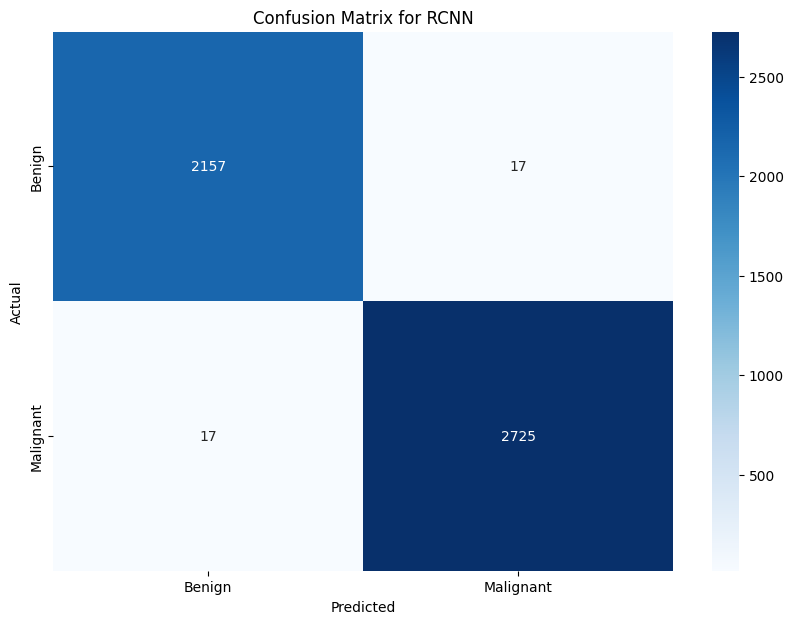

In [ ]:
# Evaluate RCNN
y_pred_rcnn = rcnn.predict(test_generator)
y_pred_rcnn = (y_pred_rcnn > 0.5).astype(int)
y_true = test_generator.classes

accuracy_rcnn = accuracy_score(y_true, y_pred_rcnn)
precision_rcnn = precision_score(y_true, y_pred_rcnn)
recall_rcnn = recall_score(y_true, y_pred_rcnn)
f1_rcnn = f1_score(y_true, y_pred_rcnn)

print(f'RCNN Accuracy: {accuracy_rcnn}')
print(f'RCNN Precision: {precision_rcnn}')
print(f'RCNN Recall: {recall_rcnn}')
print(f'RCNN F1 Score: {f1_rcnn}')
print(f'RCNN Classification Report:\n {classification_report(y_true, y_pred_rcnn)}')

# Plot confusion matrix
cm_rcnn = confusion_matrix(y_true, y_pred_rcnn)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_rcnn, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for RCNN')
plt.show()


In [ ]:
# Save RCNN model
rcnn.save('rcnn_model.h5')
print("RCNN model saved successfully.")


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


RCNN model saved successfully.


CNN

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:

# Define CNN model
cnn = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



# Data generators for training and validation
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    '/content/Thresh_seg/train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
    '/content/Thresh_seg/val',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)


Found 14745 images belonging to 2 classes.
Found 4915 images belonging to 2 classes.


In [ ]:

# Train the CNN model
history_cnn = cnn.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator
)


Epoch 1/10
461/461 [==============================] - 768s 2s/step - loss: 0.1567 - accuracy: 0.9272 - val_loss: 0.0979 - val_accuracy: 0.9670
Epoch 2/10
461/461 [==============================] - 737s 2s/step - loss: 0.0544 - accuracy: 0.9821 - val_loss: 0.0430 - val_accuracy: 0.9854
Epoch 3/10
461/461 [==============================] - 721s 2s/step - loss: 0.0362 - accuracy: 0.9883 - val_loss: 0.1066 - val_accuracy: 0.9609
Epoch 4/10
461/461 [==============================] - 736s 2s/step - loss: 0.0227 - accuracy: 0.9935 - val_loss: 0.0479 - val_accuracy: 0.9874
Epoch 5/10
461/461 [==============================] - 725s 2s/step - loss: 0.0231 - accuracy: 0.9917 - val_loss: 0.0311 - val_accuracy: 0.9931
Epoch 6/10
461/461 [==============================] - 731s 2s/step - loss: 0.0094 - accuracy: 0.9974 - val_loss: 0.0371 - val_accuracy: 0.9904
Epoch 7/10
461/461 [==============================] - 722s 2s/step - loss: 0.0170 - accuracy: 0.9950 - val_loss: 0.0377 - val_accuracy: 0.9906

Found 4916 images belonging to 2 classes.
154/154 [==============================] - 85s 547ms/step
CNN Accuracy: 0.9932872253864931
CNN Precision: 0.9952468007312614
CNN Recall: 0.9927060539752006
CNN F1 Score: 0.9939748037246667
CNN Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      2174
           1       1.00      0.99      0.99      2742

    accuracy                           0.99      4916
   macro avg       0.99      0.99      0.99      4916
weighted avg       0.99      0.99      0.99      4916



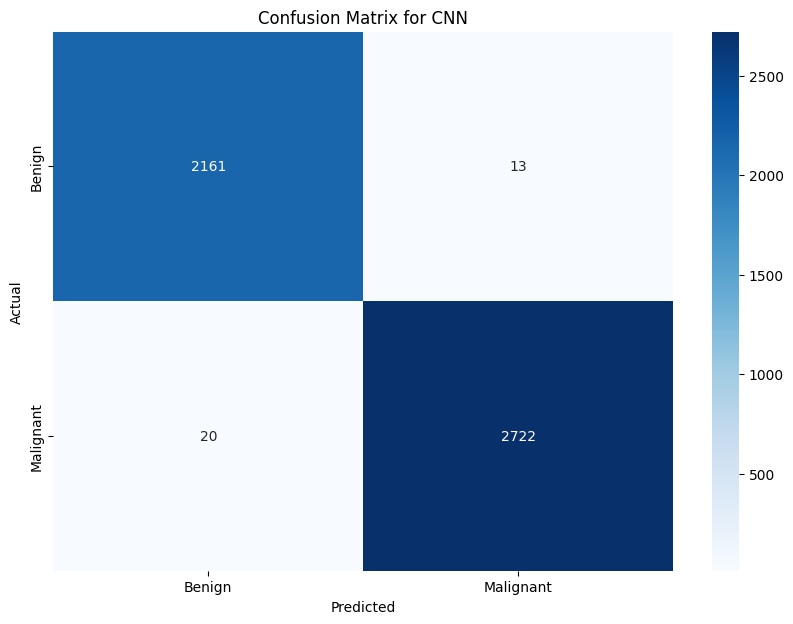

In [ ]:
# Evaluate the CNN model
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    '/content/Thresh_seg/test',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

y_pred_cnn = cnn.predict(test_generator)
y_pred_cnn = (y_pred_cnn > 0.5).astype(int)
y_true = test_generator.classes

accuracy_cnn = accuracy_score(y_true, y_pred_cnn)
precision_cnn = precision_score(y_true, y_pred_cnn)
recall_cnn = recall_score(y_true, y_pred_cnn)
f1_cnn = f1_score(y_true, y_pred_cnn)

print(f'CNN Accuracy: {accuracy_cnn}')
print(f'CNN Precision: {precision_cnn}')
print(f'CNN Recall: {recall_cnn}')
print(f'CNN F1 Score: {f1_cnn}')
print(f'CNN Classification Report:\n {classification_report(y_true, y_pred_cnn)}')

# Plot confusion matrix
cm_cnn = confusion_matrix(y_true, y_pred_cnn)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for CNN')
plt.show()


Evaluation

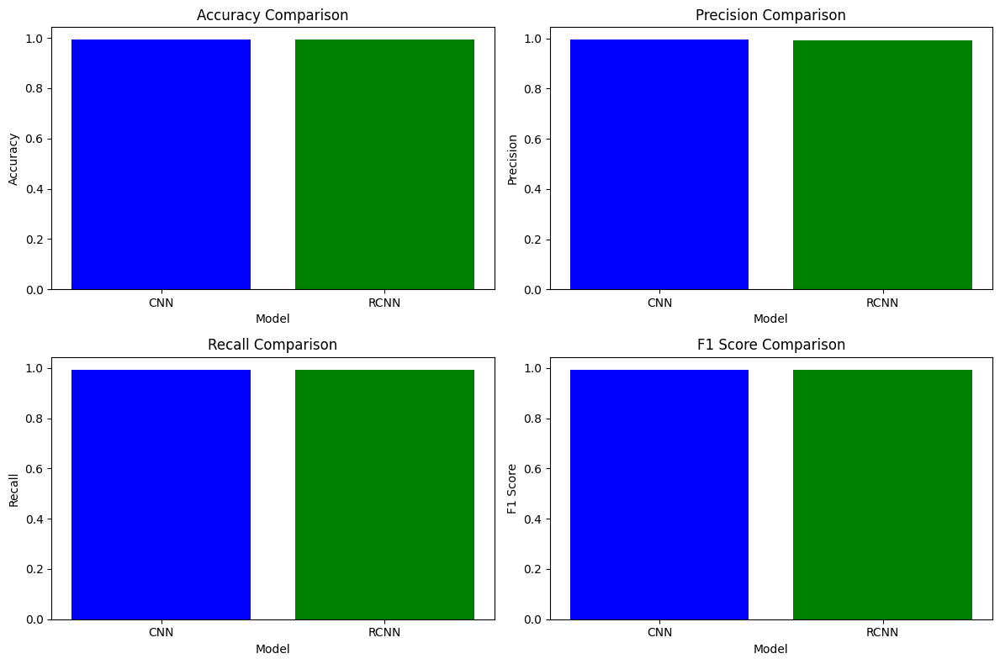

In [ ]:
# Collect evaluation metrics
models = ['CNN', 'RCNN']
accuracies = [accuracy_cnn, accuracy_rcnn]
precisions = [precision_cnn, precision_rcnn]
recalls = [recall_cnn, recall_rcnn]
f1_scores = [f1_cnn, f1_rcnn]

# Plot the metrics
plt.figure(figsize=(12, 8))

# Plot accuracies
plt.subplot(2, 2, 1)
plt.bar(models, accuracies, color=['blue', 'green'])
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')

# Plot precisions
plt.subplot(2, 2, 2)
plt.bar(models, precisions, color=['blue', 'green'])
plt.xlabel('Model')
plt.ylabel('Precision')
plt.title('Precision Comparison')

# Plot recalls
plt.subplot(2, 2, 3)
plt.bar(models, recalls, color=['blue', 'green'])
plt.xlabel('Model')
plt.ylabel('Recall')
plt.title('Recall Comparison')

# Plot F1 scores
plt.subplot(2, 2, 4)
plt.bar(models, f1_scores, color=['blue', 'green'])
plt.xlabel('Model')
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison')

plt.tight_layout()
plt.savefig('model_comparison_cnn_rcnn.png')
plt.show()


In [ ]:
from google.colab import files

# Download models
# Save the model before downloading
cnn.save('cnn.h5') # Save the cnn model

files.download('cnn.h5')
files.download('rcnn_model.h5')

# Download the comparison graph
files.download('model_comparison_cnn_rcnn.png')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>